# **1) Augmentation x**

# 라이브러리 불러오기

필요한 이미지 처리, 머신러닝 및 시각화를 위한 라이브러리를 불러옵니다.
Google Colab 환경에서 데이터에 액세스하기 위해 Google 드라이브를 연결합니다.

In [ ]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 이미지 전처리 및 데이터 로드

이미지 전처리 및 데이터 로드 로직을 정의하는 함수를 사용해 동작을 수행합니다.

In [ ]:
# 이미지 전처리 함수
def preprocess_image(image, target_size=(224, 224)):
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return image

In [ ]:
# 데이터 로드 함수
def load_data(data_folder):
    images = []
    labels = []

    class_folders = os.listdir(data_folder)
    num_classes = len(class_folders)

    for class_folder in class_folders:
        class_path = os.path.join(data_folder, class_folder)
        if os.path.isdir(class_path):
            for filename in os.listdir(class_path):
                if filename.endswith(".png"):
                    image_path = os.path.join(class_path, filename)
                    image = cv2.imread(image_path)
                    # 이미지 전처리 적용
                    image = preprocess_image(image)
                    images.append(image)
                    labels.append(class_folder)

    return np.array(images), np.array(labels), num_classes

In [ ]:
# 데이터 압축 해제
zip_path = '/content/drive/MyDrive/result_sample.zip'
extract_path = '/content/result_sample'
!unzip "$zip_path" -d "$extract_path"

Archive:  /content/drive/MyDrive/result_sample.zip
replace /content/result_sample/result_sample/result_sample_99.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


# 데이터 분할

데이터셋을 훈련 및 테스트 세트로 분할합니다.

In [ ]:
# 데이터 분할
data_folder = '/content/result_sample'
images, labels, num_classes = load_data(data_folder)
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.1, random_state=42)


# 확인용 출력
print("Number of images:", len(images))
print("Number of labels:", len(labels))


Number of images: 100
Number of labels: 100


# 데이터 시각화

이미지의 그리드를 시각화합니다.

<Figure size 640x480 with 0 Axes>

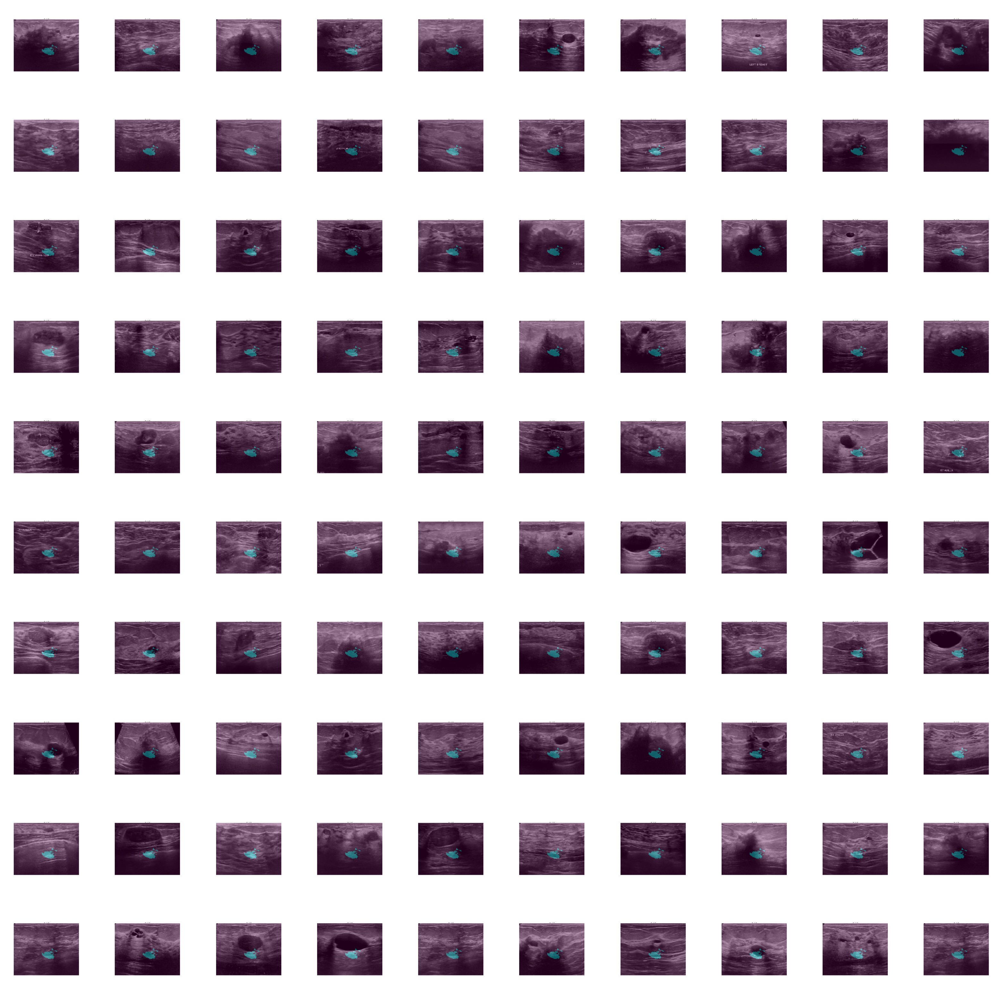

In [ ]:
# 전체 이미지의 개수
num_total_images = len(images)

# 시각화할 행과 열의 개수
num_rows = 10
num_cols = 10

# 전체 플롯에 대한 제목
plt.suptitle("Segmentation Result", fontsize=16, y=1.02)

# 전체 이미지를 나타내기 위한 2차원 그리드 생성
fig, axes = plt.subplots(num_rows, num_cols, figsize=(40, 40))

# 각 이미지를 순회하며 시각화
for i in range(num_rows):
    for j in range(num_cols):
        index = i * num_cols + j
        if index < num_total_images:
            axes[i, j].imshow(images[index], extent=[0, images[index].shape[1], 0, images[index].shape[0]])
            axes[i, j].axis("off")

# 남은 빈 서브플롯은 숨기기
for i in range(num_total_images, num_rows * num_cols):
    axes.flatten()[i].axis("off")

plt.show()


# 모델 생성

이미지 분류를 위한 간단한 CNN 모델을 정의합니다.

In [ ]:
# 모델 생성
def create_model(input_shape, num_classes):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(1, activation='sigmoid'))

    # 모델 컴파일 수정
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

input_shape = X_train[0].shape
model = create_model(input_shape, num_classes)


# 레이블 변환 및 모델 훈련

레이블을 원-핫 인코딩으로 변환하고 모델을 훈련합니다.

In [ ]:
# 레이블을 정수로 변환
label_dict = {class_name: i for i, class_name in enumerate(np.unique(labels))}
y_train_int = np.array([label_dict[label] for label in y_train])
y_test_int = np.array([label_dict[label] for label in y_test])

# 레이블을 원-핫 인코딩으로 변환
y_train_one_hot = to_categorical(y_train_int, num_classes)
y_test_one_hot = to_categorical(y_test_int, num_classes)

In [ ]:
# 모델 학습
history = model.fit(X_train, y_train_one_hot, epochs=10, batch_size=32, validation_split=0.2)


Epoch 1/10
3/3 [==============================] - 15s 4s/step - loss: 1.1832 - accuracy: 0.4583 - val_loss: 0.4323 - val_accuracy: 1.0000
Epoch 2/10
3/3 [==============================] - 9s 3s/step - loss: 0.8133 - accuracy: 0.4167 - val_loss: 0.9127 - val_accuracy: 0.0000e+00
Epoch 3/10
3/3 [==============================] - 12s 3s/step - loss: 0.7231 - accuracy: 0.4583 - val_loss: 0.9640 - val_accuracy: 0.0000e+00
Epoch 4/10
3/3 [==============================] - 10s 3s/step - loss: 0.6629 - accuracy: 0.6250 - val_loss: 0.9012 - val_accuracy: 0.0000e+00
Epoch 5/10
3/3 [==============================] - 13s 3s/step - loss: 0.6382 - accuracy: 0.5972 - val_loss: 0.8695 - val_accuracy: 0.0000e+00
Epoch 6/10
3/3 [==============================] - 15s 3s/step - loss: 0.6239 - accuracy: 0.7083 - val_loss: 0.8262 - val_accuracy: 0.0000e+00
Epoch 7/10
3/3 [==============================] - 11s 4s/step - loss: 0.6047 - accuracy: 0.8472 - val_loss: 0.7766 - val_accuracy: 0.0000e+00
Epoch 8/10


# 모델 평가

성능 지표와 그래프를 이용해 모델을 평가합니다.

In [ ]:
# 모델 평가
accuracy = model.evaluate(X_test, y_test_one_hot)[1]
print("Test Accuracy: {:.2f}%".format(accuracy))

1/1 [==============================] - 0s 343ms/step - loss: 0.6289 - accuracy: 1.0000
Test Accuracy: 1.00%


In [ ]:
# 모델 평가
Y_pred = model.predict(X_test)

# 다중 클래스 분류의 경우
if num_classes > 1:
    # 각 클래스에 대한 확률 추출
    y_pred_prob = Y_pred
else:
    # 이진 분류의 경우, 두 번째 클래스(positive class)에 대한 확률 추출
    y_pred_prob = Y_pred[:, 0]

# 원-핫 인코딩된 예측값과 실제 레이블을 클래스 레이블로 변환
y_pred_labels = np.argmax(Y_pred, axis=1)
y_test_labels = np.argmax(y_test_one_hot, axis=1)

# scikit-learn의 accuracy_score를 사용하여 정확도 계산
accuracy = accuracy_score(y_test_labels, y_pred_labels)
print('모델 정확도:', accuracy)

1/1 [==============================] - 0s 437ms/step
모델 정확도: 1.0


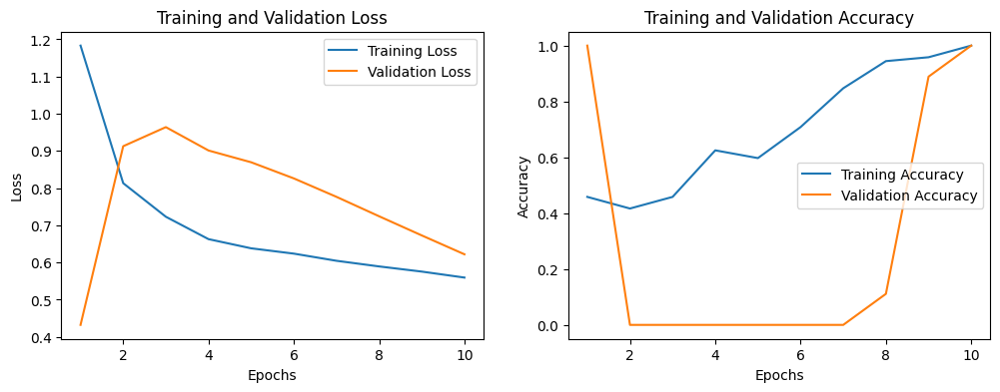

In [ ]:
# 훈련 및 검증 손실
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# 훈련 및 검증 정확도
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# 에포크 범위
epochs_range = range(1, len(train_loss) + 1)

# 손실 그래프
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# 정확도 그래프
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test_int, y_pred_labels)
print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[10]]


In [ ]:
from sklearn.metrics import precision_score

precision = precision_score(y_test_int, y_pred_labels)
print(f"Precision: {precision:.4f}")

Precision: 0.0000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import recall_score

recall = recall_score(y_test_int, y_pred_labels)
print(f"Recall: {recall:.4f}")


Recall: 0.0000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import f1_score

f1 = f1_score(y_test_int, y_pred_labels)
print(f"F1-score: {f1:.4f}")


F1-score: 0.0000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


# Grad-CAM

Grad-CAM을 사용하여 모델이 어느 부분에 주의를 기울이는지 시각적으로 확인합니다.

In [ ]:
# 모델 내의 모든 레이어 이름 출력
for layer in model.layers:
    print(layer.name)

conv2d_18
batch_normalization_24
max_pooling2d_12
conv2d_19
batch_normalization_25
max_pooling2d_13
conv2d_20
batch_normalization_26
flatten_6
dense_8
batch_normalization_27
dense_9


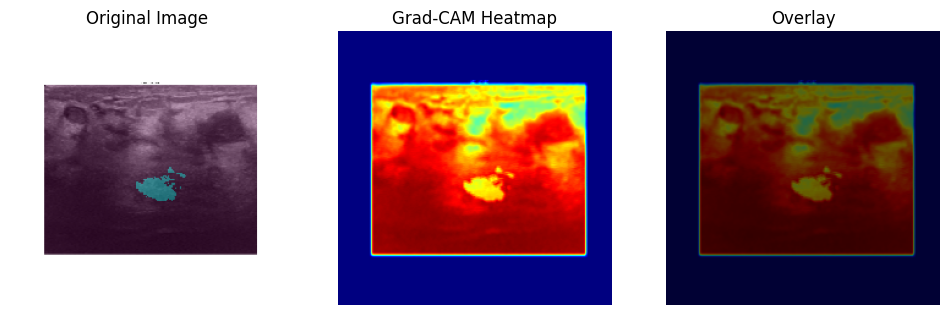

In [ ]:
# Grad-CAM 생성을 위한 함수 정의
def grad_cam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(layer_name).output, model.output])

    # 그래디언트를 계산하기 위해 GradientTape 사용
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output_value = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(conv_output_value, pooled_grads), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Grad-CAM을 생성할 레이어의 이름 선택
grad_cam_layer = "conv2d_18"  # 모델 내의 적절한 레이어 이름으로 변경

# 시각화할 테스트 세트에서 이미지 선택
img_index = 0  # 다른 이미지를 시각화하려면 인덱스 변경
img_array_vis = np.expand_dims(X_test[img_index], axis=0)

# Grad-CAM heatmap 얻기
heatmap = grad_cam(model, img_array_vis, grad_cam_layer)

# heatmap을 원래 이미지 크기로 조정
heatmap = cv2.resize(heatmap, (X_test[img_index].shape[1], X_test[img_index].shape[0]))

# heatmap 정규화
heatmap = heatmap - np.min(heatmap)
heatmap = heatmap / np.max(heatmap)

# heatmap을 0~255로 변환
heatmap = (heatmap * 255).astype(np.uint8)

# heatmap을 원본 이미지 위에 오버레이
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(X_test[img_index].astype(np.uint8), 0.6, heatmap, 0.4, 0)

# 결과를 시각화
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(X_test[img_index])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap="jet")
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(superimposed_img)
plt.title("Overlay")
plt.axis("off")

plt.show()




# **2) Augmentation O**

# 이미지 전처리 및 데이터 로드

In [ ]:
# 이미지 전처리 함수
def preprocess_image(image, target_size=(224, 224)):
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return image

# 데이터 로드 함수
def load_data(data_folder):
    images = []
    labels = []

    class_folders = os.listdir(data_folder)
    num_classes = len(class_folders)

    for class_folder in class_folders:
        class_path = os.path.join(data_folder, class_folder)
        if os.path.isdir(class_path):
            for filename in os.listdir(class_path):
                if filename.endswith(".png"):
                    image_path = os.path.join(class_path, filename)
                    image = cv2.imread(image_path)
                    # 이미지 전처리 적용
                    image = preprocess_image(image)
                    images.append(image)
                    labels.append(class_folder)

    return np.array(images), np.array(labels), num_classes


In [ ]:
# 데이터 압축 해제
zip_path = '/content/drive/MyDrive/aug_images.zip'
extract_path = '/content/aug_image'
!unzip "$zip_path" -d "$extract_path"


Archive:  /content/drive/MyDrive/aug_images.zip
replace /content/aug_image/aug_images/image_56.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


# 데이터 분할

In [ ]:
# 데이터 로드 및 분할
data_folder_2 = '/content/aug_image'
images_2, labels_2, num_classes_2 = load_data(data_folder_2)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(images_2, labels_2, test_size=0.1, random_state=42)

# 확인용 출력
print("Number of images_2 :", len(images_2))
print("Number of labels_2:", len(labels_2))


Number of images_2 : 63
Number of labels_2: 63


# 데이터 시각화

<Figure size 640x480 with 0 Axes>

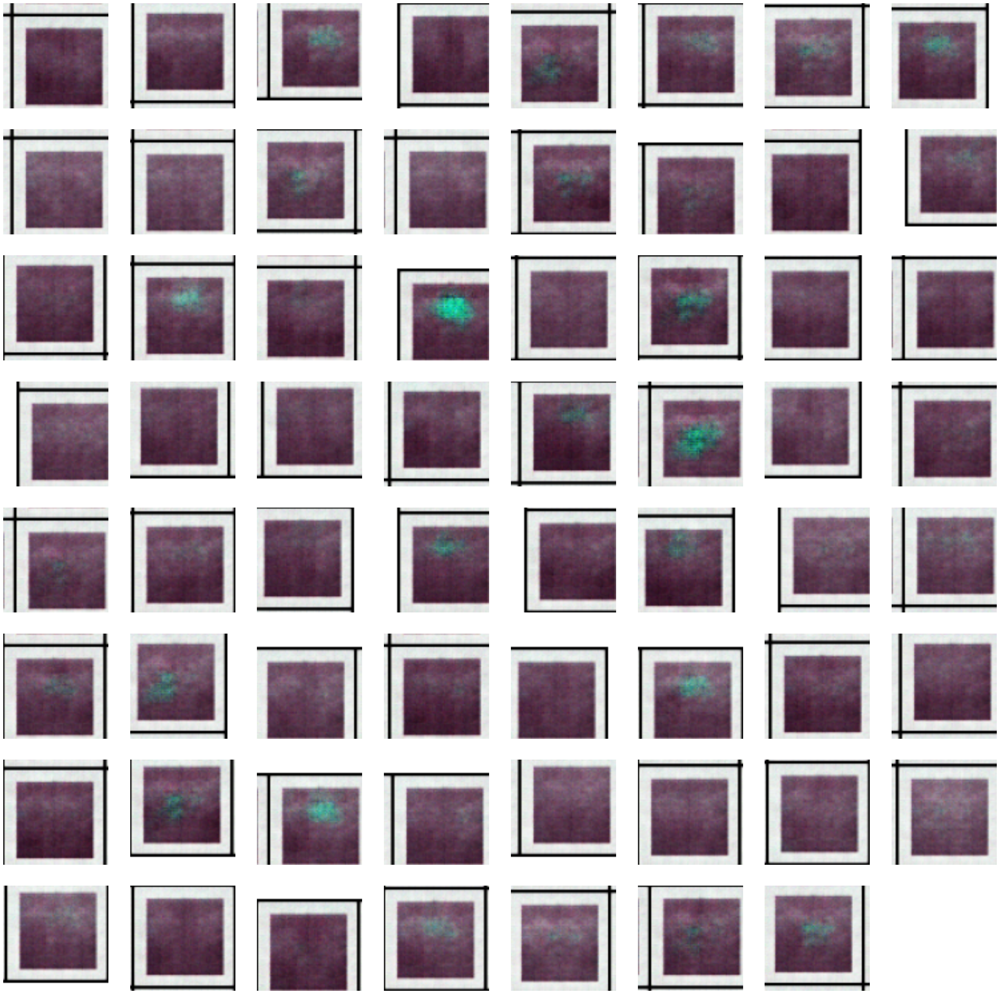

In [ ]:
# 전체 이미지의 개수 (두 번째 데이터셋)
num_total_images_2 = len(images_2)

# 시각화할 행과 열의 개수
num_rows_2 = 8
num_cols_2 = 8

# 전체 플롯에 대한 제목
plt.suptitle("Augmentation Result", fontsize=16, y=1.02)

# 전체 이미지를 나타내기 위한 2차원 그리드 생성
fig, axes = plt.subplots(num_rows_2, num_cols_2, figsize=(40, 40))

# 각 이미지를 순회하며 시각화
for i in range(num_rows_2):
    for j in range(num_cols_2):
        index = i * num_cols_2 + j
        if index < num_total_images_2:
            axes[i, j].imshow(images_2[index], extent=[0, images_2[index].shape[1], 0, images_2[index].shape[0]])
            axes[i, j].axis("off")

# 남은 빈 서브플롯은 숨기기
for i in range(num_total_images_2, num_rows_2 * num_cols_2):
    axes.flatten()[i].axis("off")

plt.show()


# 모델 생성

In [ ]:
from keras.layers import Dropout

# 모델 수정
def create_model_2(input_shape, num_classes):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dropout(0.5))

    if num_classes > 1:
        model.add(Dense(num_classes, activation='softmax'))  # 다중 클래스 분류
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    else:
        model.add(Dense(1, activation='sigmoid'))  # 이진 분류
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    model.add(BatchNormalization())

    return model

# 모델 선언
model_2 = create_model_2(input_shape_2, num_classes_2)

# 레이블 변환 및 모델 훈련

In [ ]:
# 레이블을 정수로 변환하고 원-핫 인코딩으로 변환
label_dict_2 = {class_name: i for i, class_name in enumerate(np.unique(labels_2))}
y_train_int_2 = np.array([label_dict_2[label] for label in y_train_2])
y_test_int_2 = np.array([label_dict_2[label] for label in y_test_2])
y_train_one_hot_2 = to_categorical(y_train_int_2, num_classes_2)
y_test_one_hot_2 = to_categorical(y_test_int_2, num_classes_2)


In [ ]:
# 모델 학습
history_2 = model_2.fit(X_train_2, y_train_one_hot_2, epochs=10, batch_size=32, validation_split=0.2)


Epoch 1/10
2/2 [==============================] - 14s 2s/step - loss: 7.9338 - accuracy: 0.4318 - val_loss: 2.1656 - val_accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 6s 2s/step - loss: 3.5028 - accuracy: 0.5227 - val_loss: 6.0489 - val_accuracy: 0.0000e+00
Epoch 3/10
2/2 [==============================] - 8s 2s/step - loss: 5.5415 - accuracy: 0.0000e+00 - val_loss: 8.4148 - val_accuracy: 0.0000e+00
Epoch 4/10
2/2 [==============================] - 6s 2s/step - loss: 5.2466 - accuracy: 0.0000e+00 - val_loss: 9.6576 - val_accuracy: 0.0000e+00
Epoch 5/10
2/2 [==============================] - 7s 3s/step - loss: 4.9759 - accuracy: 0.0000e+00 - val_loss: 7.8995 - val_accuracy: 0.0833
Epoch 6/10
2/2 [==============================] - 7s 2s/step - loss: 4.7525 - accuracy: 0.0000e+00 - val_loss: 6.2277 - val_accuracy: 0.0833
Epoch 7/10
2/2 [==============================] - 6s 2s/step - loss: 4.5695 - accuracy: 0.0000e+00 - val_loss: 4.2780 - val_accuracy: 0.5833
Epoc

# 모델 평가

In [ ]:
# 모델 평가
accuracy_2 = model_2.evaluate(X_test_2, y_test_one_hot_2)[1]
print("테스트 정확도 : {:.2f}%".format(accuracy_2))


1/1 [==============================] - 1s 1s/step - loss: 0.0640 - accuracy: 1.0000
테스트 정확도 : 1.00%


In [ ]:
# 모델 평가
Y_pred_2 = model_2.predict(X_test_2)

# 다중 클래스 분류의 경우
if num_classes_2 > 1:
    # 각 클래스에 대한 확률 추출
    y_pred_prob_2 = Y_pred_2
else:
    # 이진 분류의 경우, 두 번째 클래스(positive class)에 대한 확률 추출
    y_pred_prob_2 = Y_pred_2[:, 0]

# 원-핫 인코딩된 예측값과 실제 레이블을 클래스 레이블로 변환
y_pred_labels_2 = np.argmax(Y_pred_2, axis=1)
y_test_labels_2 = np.argmax(y_test_one_hot_2, axis=1)

# scikit-learn의 accuracy_score를 사용하여 정확도 계산
accuracy_2 = accuracy_score(y_test_labels_2, y_pred_labels_2)
print('모델 정확도 :', accuracy_2)


1/1 [==============================] - 0s 416ms/step
모델 정확도 : 1.0


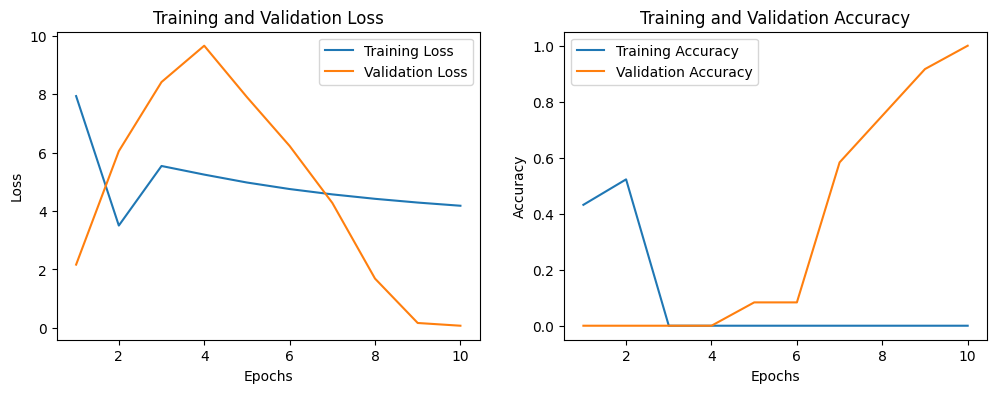

In [ ]:
# 훈련 및 검증 손실
train_loss_2 = history_2.history['loss']
val_loss_2 = history_2.history['val_loss']

# 훈련 및 검증 정확도
train_acc_2 = history_2.history['accuracy']
val_acc_2 = history_2.history['val_accuracy']

# 에포크 범위
epochs_range_2 = range(1, len(train_loss_2) + 1)

# 손실 그래프
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range_2, train_loss_2, label='Training Loss')
plt.plot(epochs_range_2, val_loss_2, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# 정확도 그래프
plt.subplot(1, 2, 2)
plt.plot(epochs_range_2, train_acc_2, label='Training Accuracy')
plt.plot(epochs_range_2, val_acc_2, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

In [ ]:
# 혼동 행렬
cm_2 = confusion_matrix(y_test_int_2, y_pred_labels_2)
print("Confusion Matrix :")
print(cm_2)

Confusion Matrix :
[[7]]


In [ ]:
# 정밀도
precision_2 = precision_score(y_test_int_2, y_pred_labels_2, average='weighted')  # 변경: 정밀도 계산 방법 지정
print(f"Precision : {precision_2:.4f}")

Precision : 1.0000


In [ ]:
# 재현율
recall_2 = recall_score(y_test_int_2, y_pred_labels_2, average='weighted')  # 변경: 재현율 계산 방법 지정
print(f"Recall : {recall_2:.4f}")

Recall : 1.0000


In [ ]:
# F1-score
f1_2 = f1_score(y_test_int_2, y_pred_labels_2, average='weighted')  # 변경: F1-score 계산 방법 지정
print(f"F1-score: {f1_2:.4f}")

F1-score: 1.0000


# Grad-CAM

In [ ]:
# 모델 내의 모든 레이어 이름 출력
for layer in model_2.layers:
    print(layer.name)

conv2d_21
batch_normalization_28
max_pooling2d_14
conv2d_22
batch_normalization_29
max_pooling2d_15
conv2d_23
batch_normalization_30
flatten_7
dropout_1
dense_10
batch_normalization_31


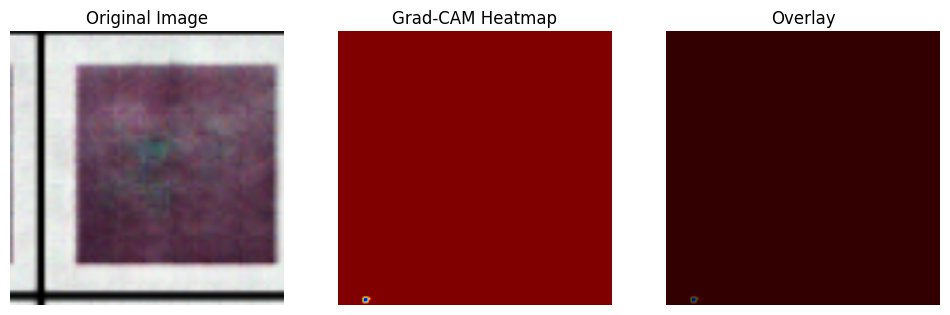

In [ ]:
# Grad-CAM 생성을 위한 함수 정의
def grad_cam(model, img_array, layer_name):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(layer_name).output, model.output])

    # 그래디언트를 계산하기 위해 GradientTape 사용
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output_value = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(conv_output_value, pooled_grads), axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # 수정: heatmap 정규화를 수정하여 최대값이 1이 되도록 조정
    heatmap /= tf.reduce_max(heatmap)

    return heatmap

# Grad-CAM을 생성할 레이어의 이름 선택
grad_cam_layer = "conv2d_22"  # 모델 내의 적절한 레이어 이름으로 변경

# 시각화할 테스트 세트에서 이미지 선택
img_index = 0  # 다른 이미지를 시각화하려면 인덱스 변경
img_array_vis = np.expand_dims(X_test_2[img_index], axis=0)

# Grad-CAM heatmap 얻기
heatmap = grad_cam(model_2, img_array_vis, grad_cam_layer)

# heatmap을 NumPy 배열로 변환
heatmap = heatmap.numpy()

# heatmap을 원래 이미지 크기로 조정
heatmap = cv2.resize(heatmap, (X_test_2[img_index].shape[1], X_test_2[img_index].shape[0]))

# heatmap을 0~255로 변환 (수정 후)
heatmap = (heatmap * 255).astype(np.uint8)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_GRAY2BGR)

# heatmap을 원본 이미지 위에 오버레이
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(X_test_2[img_index].astype(np.uint8), 0.6, heatmap, 0.4, 0)

# 결과를 시각화
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(X_test_2[img_index])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap="jet")
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(superimposed_img)
plt.title("Overlay")
plt.axis("off")

plt.show()
